<a href="https://colab.research.google.com/github/dryanguasr/ColabProjects/blob/main/02_Quebec_Challenge_Dryanguasr.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Challenge Objective

To develop a load forecasting model for the next day with resolution of 1 h
using data of 4 h before prediction, in order to support operation decision
making in power systems using data analytic and computational intelligence

# Methodology

*  Data can be download from github after July 15 - 2022,
https://github.com/dlalvareza/Quebec_Challenge
*  Reference Colab Notebook will be provided -
https://colab.research.google.com/drive/1DyqU2MWjlTSB3X7kBKYTaTLejvJ2b4gj?usp=sharing
*  The main topics will be addressed in the course
*  A google Colab with the proposed model must be submitted by email to
dlalvareza@unal.edu.co
*  A presentation of the best proposals is required

# Submission Process


*   A Colab file describing and implementing the model must be sent by email to dlalvareza@unal.edu.co before agust 3 2022 23:59:59.

*   The model must consider that data is available until 21 h of the day before prediction.

*   The structure of the input raw file must be kept, the same sctructure will
be used for evaluating and scoring the model.

The next two weeks of the data provided for training the model will be used
to eval the proposals. The ranking will be according to the less **Mean Square
Error** obtained in the load prediction.

# Pipeline
A machine learning pipeline:
 
<div style='width: auto; float: center'/>
 <img src="https://raw.githubusercontent.com/dlalvareza/Quebec_Challenge/1983ff1a47aed444c33cbd575a26df650589ea03/01_Figure/IC_Pipeline_eng.svg" style='height: 150px; width: auto; object-fit: contain; center: right'/>       
</div>

In [ ]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
from plotly.subplots import make_subplots
from scipy import stats
import tensorflow as tf;
from tensorflow import keras;
from tensorflow.keras import layers;

# 1 Data acquisition
<div style='width: auto; float: center'/>
 <img src="https://raw.githubusercontent.com/dlalvareza/Quebec_Challenge/master/01_Figure/IC_Pipeline_eng_acquisition.svg" style='height: 150px; width: auto; object-fit: contain; center: right'/>       
</div>
Raw data acquisition from github repository <a href="https://github.com/dlalvareza/Quebec_Challenge"> dlalvareza/Quebec_Challenge </a>  using a pandas dataframe

In [ ]:
df_url = "https://raw.githubusercontent.com/dlalvareza/Quebec_Challenge/9b991364d74148e47c43fc5c6d917fbdad6cc53a/Quebec_Data.csv"
df = pd.read_csv(df_url,index_col=0)
df

,Date,Dem,Temp,Sen,Wind,rad
0,2020-01-01 00:14:59.999997,5256.732422,-2.321961,-3.480331,24.883946,-0.328391
1,2020-01-01 00:30:00.000003,5378.242676,-2.192610,-3.136374,20.628355,-0.123147
2,2020-01-01 00:45:00.000010,5377.291504,-2.100000,-2.900000,18.000000,0.000000
3,2020-01-01 01:00:00.000017,5358.460449,-2.039282,-2.754692,16.710934,0.057468
4,2020-01-01 01:15:00.000023,5378.946289,-2.005608,-2.683934,16.473211,0.065678
...,...,...,...,...,...,...
30810,2020-11-16 22:45:00.206594,5345.116211,-1.000000,-3.000000,18.000000,0.000000
30811,2020-11-16 23:00:00.206601,5284.216797,-0.762107,-3.071385,18.781490,-0.002217
30812,2020-11-16 23:15:00.206607,5279.326660,-0.459566,-3.231185,20.024405,-0.003329
30813,2020-11-16 23:30:00.206614,5351.961426,-0.227242,-3.450393,21.005117,-0.002777


Dataframe information

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30815 entries, 0 to 30814
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    30815 non-null  object 
 1   Dem     30761 non-null  float64
 2   Temp    30815 non-null  float64
 3   Sen     30815 non-null  float64
 4   Wind    30815 non-null  float64
 5   rad     30815 non-null  float64
dtypes: float64(5), object(1)
memory usage: 1.6+ MB


# 2 Wrangle
<div style='width: auto; float: center'/>
 <img src="https://raw.githubusercontent.com/dlalvareza/Quebec_Challenge/master/01_Figure/IC_Pipeline_eng_Wrangle.svg" style='height: 150px; width: auto; object-fit: contain;float:  center'/>  
   
Time series assessment using pandas

In [ ]:
df['Date'] = pd.to_datetime(df['Date'])

Data wrangle - Adding column to the dataframe

In [ ]:
df['hour']    = (100*(df['Date'].dt.hour+df['Date'].dt.minute.values/60)).astype(int)/100
df['day']     = df['Date'].dt.dayofweek
df['month']   = df['Date'].dt.month
df['week']    = df.Date.dt.isocalendar().week

Restoring cyclic properties of date information based on [How to Handle Cyclical Data in Machine Learning - Dario Radečić
](https://towardsdatascience.com/how-to-handle-cyclical-data-in-machine-learning-3e0336f7f97c)

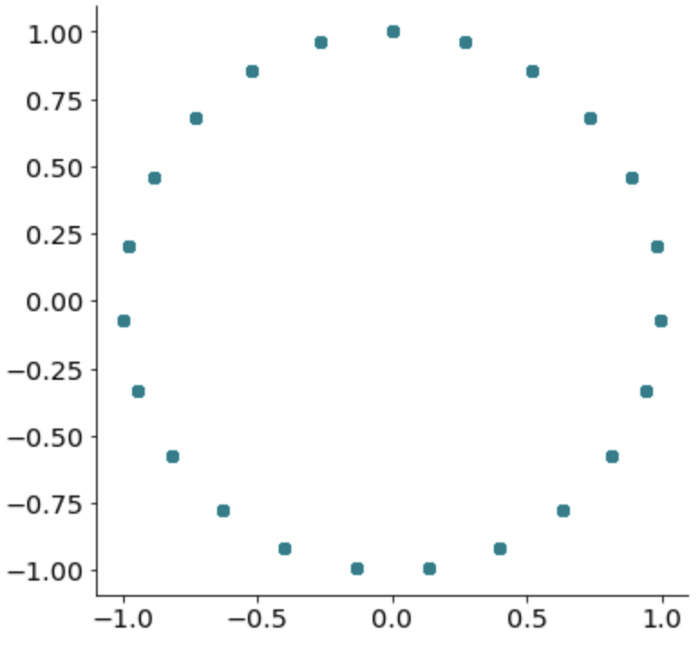



In [ ]:
df['S_hour']   = np.sin(2 * np.pi * df['hour'] / 24)
df['C_hour']   = np.cos(2 * np.pi * df['hour'] / 24)
df['S_day']    = np.sin(2 * np.pi * df['day'] / 7)
df['C_day']    = np.cos(2 * np.pi * df['day'] / 7)
df['S_week']   = np.sin(2 * np.pi * df['week'] / 52)
df['C_week']   = np.cos(2 * np.pi * df['week'] / 52)                     
df['S_month']  = np.sin(2 * np.pi * df['month'] / 12)
df['C_month']  = np.cos(2 * np.pi * df['month'] / 12)

Data desciption

In [ ]:
df.describe()

,Dem,Temp,Sen,Wind,rad,hour,day,month,week,S_hour,C_hour,S_day,C_day,S_week,C_week,S_month,C_month
count,30761.000000,30815.000000,30815.000000,30815.000000,30815.000000,30815.000000,30815.000000,30815.000000,30815.000000,3.081500e+04,3.081500e+04,30815.000000,30815.000000,30815.000000,30815.000000,3.081500e+04,3.081500e+04
mean,3818.402173,4.689034,-0.040460,15.404431,540.393906,11.875385,3.006263,5.788317,23.714133,-1.695814e-07,-3.244106e-05,-0.002467,-0.001935,0.035578,-0.125931,1.837043e-02,-1.355166e-01
std,1868.361618,10.576808,11.007457,9.542668,805.705704,6.927723,2.000047,3.044606,13.240633,7.071297e-01,7.071068e-01,0.706858,0.707371,0.742030,0.657495,7.465407e-01,6.511579e-01
min,0.000000,-25.683048,-32.500000,-3.038165,-134.301203,0.000000,0.000000,1.000000,1.000000,-1.000000e+00,-1.000000e+00,-0.974928,-0.900969,-1.000000,-1.000000,-1.000000e+00,-1.000000e+00
25%,2159.076660,-2.250877,-7.557953,8.625139,0.000000,6.000000,1.000000,3.000000,12.000000,-7.071068e-01,-7.071068e-01,-0.781831,-0.900969,-0.748511,-0.748511,-8.660254e-01,-8.660254e-01
50%,3677.375488,4.935605,0.131900,13.262407,61.211434,12.000000,3.000000,6.000000,24.000000,1.224647e-16,-1.836970e-16,0.000000,-0.222521,0.239316,-0.239316,1.224647e-16,-1.836970e-16
75%,5264.075195,13.609578,8.966852,20.723065,869.565016,17.875000,5.000000,8.000000,35.000000,7.071068e-01,7.071068e-01,0.781831,0.623490,0.748511,0.464723,8.660254e-01,5.000000e-01
max,8968.287109,28.319338,21.422304,65.770751,3945.524049,23.750000,6.000000,11.000000,47.000000,1.000000e+00,1.000000e+00,0.974928,1.000000,1.000000,0.992709,1.000000e+00,8.660254e-01


## Box plot using seaborn library
Power Consume per hour of day


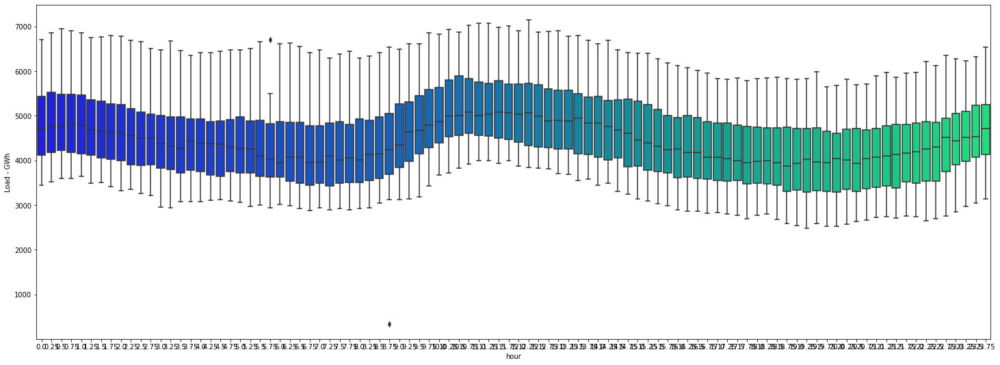

In [ ]:
plt.figure(figsize=(25, 9))
sns.boxplot(x="hour", y="Dem", data=df[df['month']>=10],palette='winter')
plt.ylabel("Load - GWh");

Box plot for week day

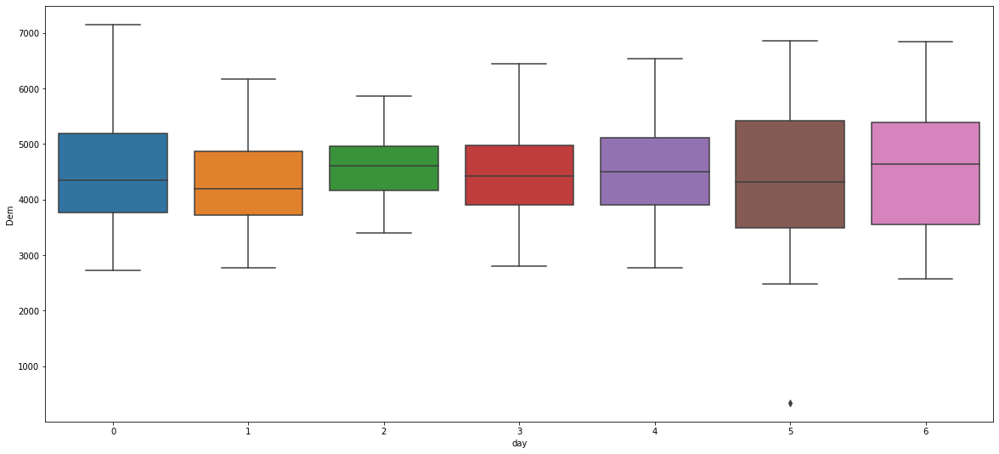

In [ ]:
plt.figure(figsize=(20, 9))
sns.boxplot(x="day", y="Dem", data=df[df['month']>=10])

In [ ]:
df.Dem.interpolate(method='linear', inplace=True, axis=0)
df.rad.interpolate(method='linear',inplace=True, axis=0)

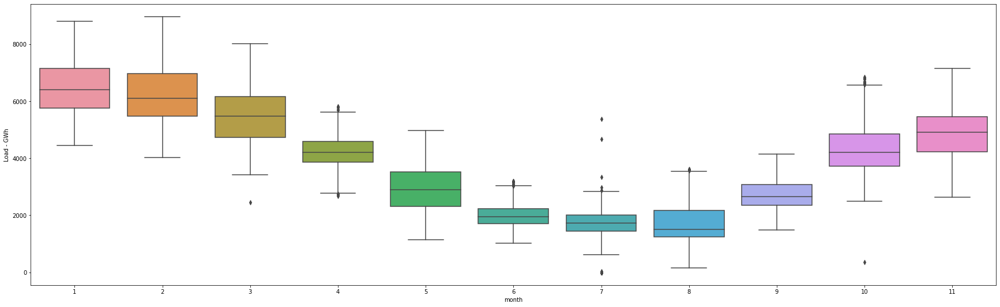

In [ ]:
plt.figure(figsize=(30, 9))
sns.boxplot(x="month", y="Dem", data=df)
plt.ylabel("Load - GWh");

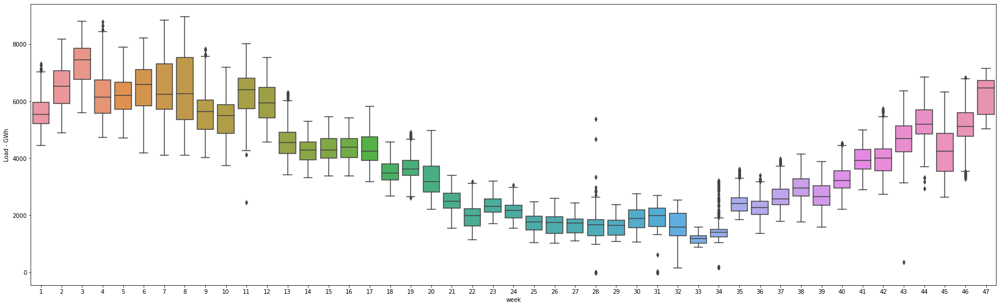

In [ ]:
plt.figure(figsize=(30, 9))
sns.boxplot(x="week", y="Dem", data=df)
plt.ylabel("Load - GWh");

In [ ]:
df['date'] = pd.to_datetime(df['Date']).dt.date
df_nine            = df[df.hour==21].groupby(['date'])['Dem'].sum()
df_nine            = df_nine.to_frame()
df_nine            = df_nine.reset_index()
df_nine            = df_nine.rename(columns = {'Dem':'Dem_21'})
df_nine['date']    = df_nine['date']
df = df.merge(df_nine, how='left', on='date')

df['Temp_Avg']      = df['Temp'].rolling(1*4, center=False).mean()
df['Dem_24']        = df['Dem'].shift(24*4)
df['Dem_48']        = df['Dem'].shift(48*4)
df['Dem_24x7']      = df['Dem'].shift(24*7*4)
df['Dem_24']        = np.where(df.hour>21,df['Dem_48'],df['Dem_24'])

Instead of using the 48 hours value after 21h, the value at 21h will be hold as the temporal auto-correlation of this value is apparently higher.

In [ ]:
buffer_serie = np.array(df['Dem_24'].copy())
for index, value in enumerate(df['hour']):
  if(value > 21):
    buffer_serie[index] = buffer_serie[index-1]
df['Dem_24'] = buffer_serie

df['Change_24'] = df['Dem']-df['Dem_24']
df['Z_Change']  = (df['Change_24'] - df['Change_24'].mean())/df['Change_24'].std(ddof=0)

In [ ]:
df['Z_Change']
#df = df[df['month']>=10]
df_forecast = df.iloc[24*7*4:]

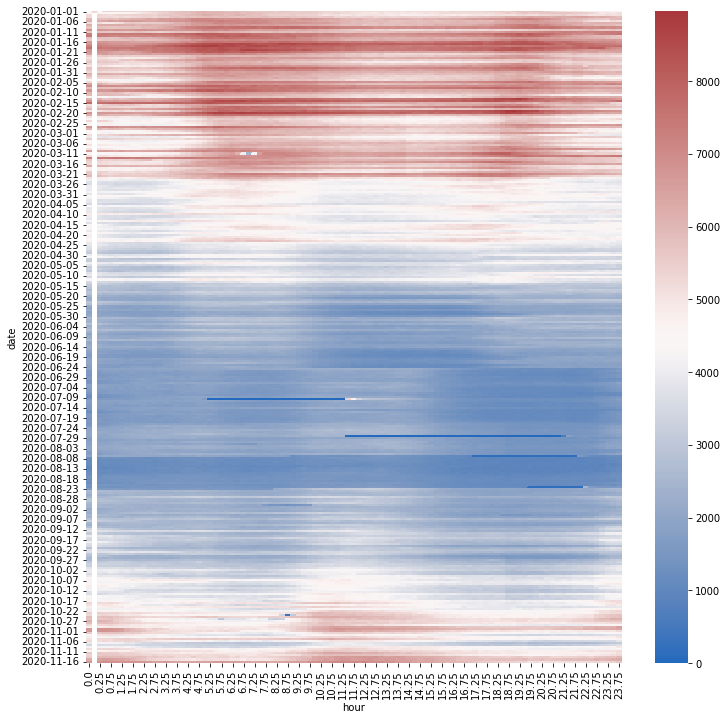

In [ ]:
flights = df.pivot("date", "hour", "Dem")
flights 
plt.figure(figsize = (12,12))
ax = sns.heatmap(flights,cmap='vlag')

# 3 Visual Assessment
<div style='width: auto; float: center'/>
 <img src="https://raw.githubusercontent.com/dlalvareza/Quebec_Challenge/master/01_Figure/IC_Pipeline_eng_Visual.svg" style='height: 150px; width: auto; object-fit: contain;float:  center'/> 

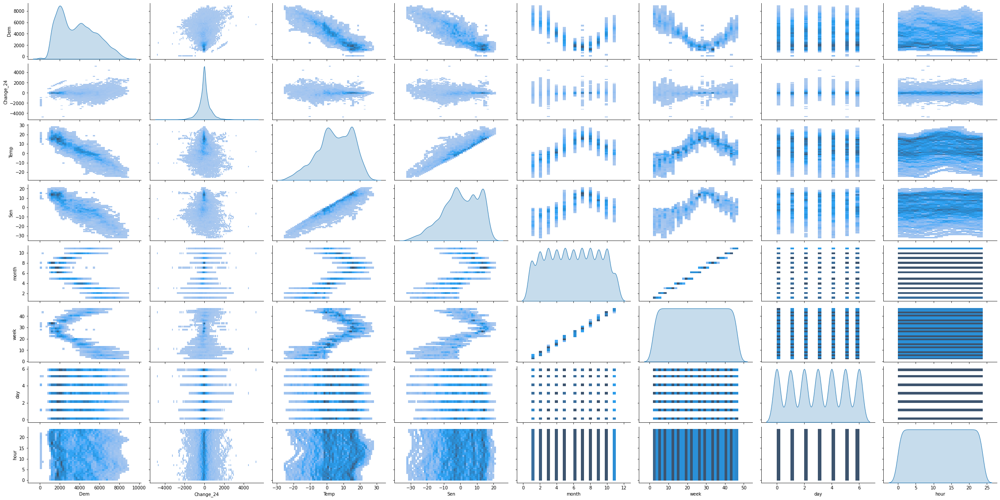

In [ ]:
sns.pairplot(df_forecast[['Dem','Change_24','Temp','Sen','month','week','day','hour']], diag_kind= 'kde', kind="hist", height=2,aspect=2);

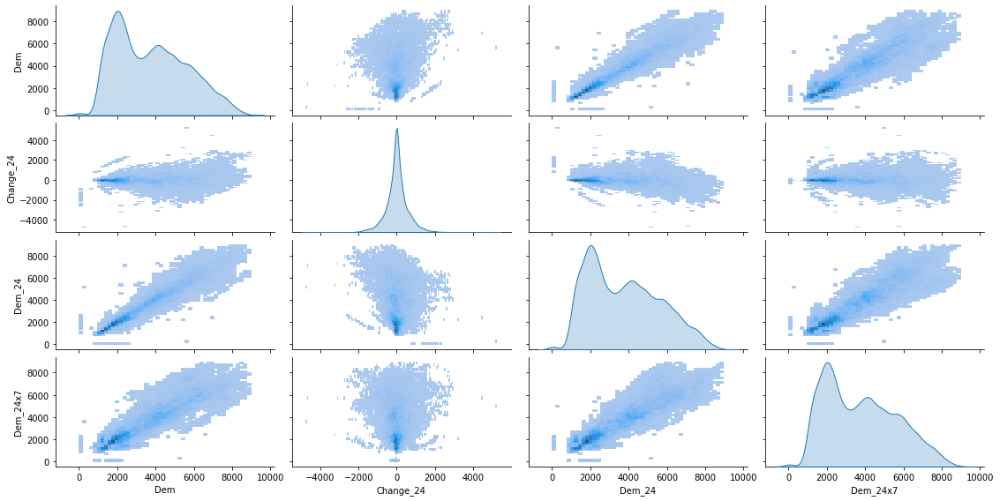

In [ ]:
sns.pairplot(df_forecast[['Dem','Change_24','Dem_24','Dem_24x7']], diag_kind= 'kde', kind="hist", height=2,aspect=2);

## Correlation plot

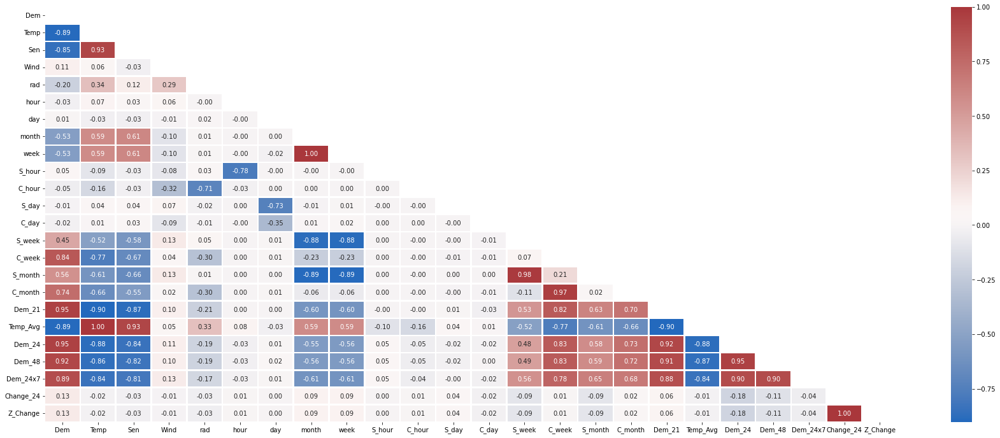

In [ ]:
df_corr = df_forecast.drop(columns='Date')
df_corr = df_corr.corr()
columns_name = df_corr.index.values
df_corr = df_corr[df_corr.index.values]
matrix = np.triu(df_corr)
fig = plt.figure(figsize=(30, 12))
sns.heatmap(df_corr, annot=True, fmt='.2f',linewidth=1.5,cmap='vlag',mask=matrix)
plt.show()

## Time behaviour
Temperature and power demand

In [ ]:
subfig = make_subplots(specs=[[{"secondary_y": True}]])
fig = px.line(df, y='Temp',x='Date')
fig.update_traces(line_color='red')
fig2 = px.line(df, y='Dem',x='Date')
fig2.update_traces(yaxis="y2")
subfig.add_traces(fig.data + fig2.data)
subfig.show()

In [ ]:
fig = px.line(df, y='Change_24',x='Date')
fig.update_traces(line_color='green')
fig.show()

# 3 Modeling
<div style='width: auto; float: center'/>
 <img src="https://raw.githubusercontent.com/dlalvareza/Quebec_Challenge/master/01_Figure/IC_Pipeline_eng_Modeling.svg" style='height: 150px; width: auto; object-fit: contain;float:  center'/> 

### 3.1 Trainning data
The training data is filtered not considering blackouts and abnormal changes (measured according a Z score)

In [ ]:
df_ent  = df_forecast.iloc[:-24*14*4]
df_ent = df_ent.dropna()
df_ent = df_ent[abs(df_ent['Z_Change'])<2]
df_ent = df_ent[df_ent['Dem']>200]
df_ent = df_ent[df_ent['Dem_24']>200]
#df_ent = df_ent[(df_ent['week']<=10) | (df_ent['week']>=39)]
#df_ent = df_ent[df_ent['month']>=10]
df_test = df_forecast.iloc[-24*14*4:]
interest_vars = ['Dem_24', 'C_week','S_week','C_day','S_day','C_hour','S_hour']
df_ent_x  = df_ent[interest_vars].to_numpy()
df_ent_y  = df_ent['Dem'].to_numpy()
df_test_x = df_test[interest_vars].to_numpy()
df_test_y = df_test['Dem'].to_numpy()
df_ent_x.shape

(26982, 7)

In [ ]:
subfig = make_subplots(specs=[[{"secondary_y": True}]])
fig = px.line(df, y='Dem',x='Date')
fig.update_traces(line_color='blue')
fig2 = px.line(df_ent, y='Dem',x='Date')
fig2.update_traces(line_color='red')
subfig.add_traces(fig.data + fig2.data)
subfig.show()


### 3.2 Development - Tensorflow keras
<img src="https://www.gstatic.com/devrel-devsite/prod/v83c28b42a9d2de845cf6ea5b33e8c3314f0e1ea60229353829f7578993509959/tensorflow/images/lockup.svg" alt="drawing" width="400"/>
<img src="https://keras.io/img/logo-small.png" alt="drawing" width="400"/>

#### Normalization

In [ ]:
x_ent  = np.asarray(df_ent_x).astype('float64')
x_test = np.asarray(df_test_x).astype('float64')

#### Build the ANN

In [ ]:
def build_and_compile_model():
  model = keras.Sequential(
      [
      #layers.BatchNormalization(),
      layers.Dense(100, activation='relu'),
      layers.Dense(60, activation='relu'),
      layers.Dense(1)
      ])
  model.compile(loss='MeanSquaredError',
                optimizer=tf.keras.optimizers.Adam(0.01))
  return model

## 3.3 ANN Fitting - Trainning

In [ ]:
%%time
n_epochs = 80
ANN_model = build_and_compile_model()
history = ANN_model.fit(
    x_ent,
    df_ent_y,
    validation_split=0.01,
    verbose=1, epochs=n_epochs)

Epoch 1/80
835/835 [==============================] - 3s 2ms/step - loss: 252938.2188 - val_loss: 282503.8438
Epoch 2/80
835/835 [==============================] - 2s 2ms/step - loss: 200260.4531 - val_loss: 389402.5625
Epoch 3/80
835/835 [==============================] - 2s 2ms/step - loss: 196260.2188 - val_loss: 325448.6875
Epoch 4/80
835/835 [==============================] - 2s 3ms/step - loss: 192329.6250 - val_loss: 270800.6562
Epoch 5/80
835/835 [==============================] - 2s 2ms/step - loss: 191083.8594 - val_loss: 309526.8750
Epoch 6/80
835/835 [==============================] - 2s 2ms/step - loss: 187776.8594 - val_loss: 338470.5312
Epoch 7/80
835/835 [==============================] - 2s 2ms/step - loss: 189653.6250 - val_loss: 434269.8125
Epoch 8/80
835/835 [==============================] - 2s 2ms/step - loss: 186114.4375 - val_loss: 308989.9062
Epoch 9/80
835/835 [==============================] - 2s 2ms/step - loss: 187175.9219 - val_loss: 266797.9688
Epoch 10/8

In [ ]:
subfig = make_subplots(specs=[[{"secondary_y": True}]])
fig = px.line(history.history, y='loss',x=range(n_epochs))
fig.update_traces(line_color='blue')
fig2 = px.line(history.history, y='val_loss',x=range(n_epochs))
fig2.update_traces(line_color='orange')
fig2.update_traces(yaxis="y2")
subfig.add_traces(fig.data + fig2.data)
subfig.show()

## 3.4 ANN evaluation

In [ ]:
def plot_forecast(pred,test):
    plt.figure(figsize=(10,4))
    plt.plot(df_test['Date'],test,color='#66FF03')
    plt.plot(df_test['Date'],pred,'--',color='#6104CF')
    plt.ylabel("Load - GWh",color='#2B30F0')
    plt.xlabel("Date",color='#2B30F0')
    plt.xlim([df_test['date'].min(), df_test['date'].max()])
    plt.legend(['Data','Forecast'])

In [ ]:
def eval_error(pred,df_test):
    df_eval = 100*abs(pred -df_test)/df_test
    print("Mean error "+str(round(df_eval.mean(),2)))
    df_eval = abs(pred -df_test)
    print("Root mean squere error - kWh "+str(round(df_eval.mean(),2)))

In [ ]:
def eval_error_alt(pred,df_test):
    Error = pred -df_test
    MPE = round((100*abs(Error)/df_test).mean(),2)
    print("Mean Percentual Error - [%] "+str(MPE))
    MAE = round(abs(Error).mean(),2)
    print("Mean Absolute Error - [kWh] "+str(MAE))
    MSE = round((Error**2).mean(),2)
    print("\033[1m" + "Mean Squared Error - [kWh^2] "+str(MSE) +  "\033[0m")
    RMSE = round(np.sqrt((Error**2).mean()),2)
    print("Root Mean Squared error - [kWh] "+str(RMSE))
    return MPE, MAE, MSE, RMSE

Mean error 12.47
Root mean squere error - kWh 555.86


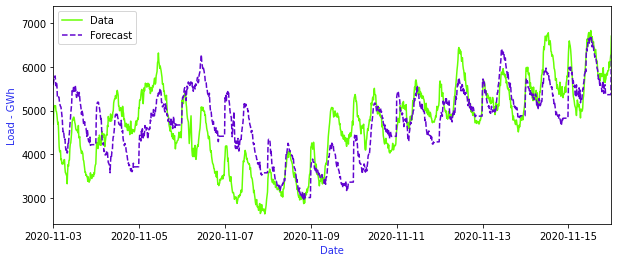

In [ ]:
y_mul_par = ANN_model.predict(x_test)
plot_forecast(y_mul_par,df_test_y)
eval_error(y_mul_par[:,0],df_test_y)

In [ ]:
ANN_MPE, ANN_MAE, ANN_MSE, ANN_RMSE = eval_error_alt(y_mul_par[:,0],df_test_y)

Mean Percentual Error - [%] 12.47
Mean Absolute Error - [kWh] 555.86
Mean Square Error - [kWh^2] 466353.71
Root Mean Square error - [kWh] 682.9


In [ ]:
trainPredict = ANN_model.predict(x_ent)
testPredict= ANN_model.predict(x_test)
predicted=np.concatenate((trainPredict,testPredict),axis=0)

trainScore = ANN_model.evaluate(x_ent, df_ent_y, verbose=0)
print(trainScore)

subfig = make_subplots(specs=[[{"secondary_y": True}]])
fig = px.line(df, y='Dem',x='Date')
fig.update_traces(line_color='blue')
fig2 = px.line(x=df_ent['Date'], y=trainPredict.reshape(-1))
fig2.update_traces(line_color='orange')
fig3 = px.line(x=df_test['Date'], y=testPredict.reshape(-1))
fig3.update_traces(line_color='red')
subfig.add_traces(fig.data + fig2.data + fig3.data)
subfig.show()

168635.59375


# 3.5. Simple Approach
As most models tend to forecast the following day as the repetition of the previous, this simple approach does directly that outperforming other more complex approaches.

In [ ]:
df_direct_ent = df_ent['Dem_24']
buffer_serie = np.array(df_ent['Dem_24'].copy())
for index, value in enumerate(df_ent['hour']):
  if(value > 21):
    buffer_serie[index] = buffer_serie[index-1]
df_direct_ent = buffer_serie

df_direct_test = df_test['Dem_24']
buffer_serie = df_test['Dem_24'].copy()
for index, value in buffer_serie.items():
  if(df_test['hour'][index] > 21):
    buffer_serie[index] = buffer_serie[index-1]
df_direct_test = buffer_serie

subfig = make_subplots(specs=[[{"secondary_y": True}]])
fig = px.line(df, y='Dem',x='Date')
fig2 = px.line(x=df_ent['Date'], y=df_direct_ent)
fig2.update_traces(line_color='orange')
fig3 = px.line(x=df_test['Date'], y=df_direct_test)
fig3.update_traces(line_color='red')
subfig.add_traces(fig.data + fig2.data + fig3.data)
subfig.show()

Mean Percentual Error - [%] 12.89
Mean Absolute Error - [kWh] 585.84
Mean Square Error - [kWh^2] 516911.5
Root Mean Square error - [kWh] 718.97


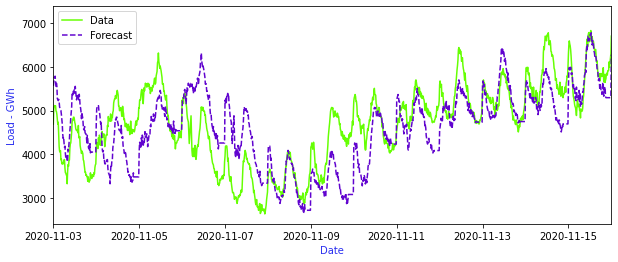

In [ ]:
y_mul_par = df_direct_test
plot_forecast(y_mul_par,df_test_y)
LW_MPE, LW_MAE, LW_MSE, LW_RMSE = eval_error_alt(y_mul_par,df_test_y)

# 3.6 Radom Forest Approach
Instead of using ANN to do the prediction a Random Forest regressor is employed obtaining similar results.

In [ ]:
from sklearn.ensemble import RandomForestRegressor

RF_model= RandomForestRegressor(n_estimators=100,criterion='squared_error')
RF_model.fit(df_ent_x,df_ent_y)

RandomForestRegressor()

Mean error 13.55
Root mean squere error - kWh 602.54


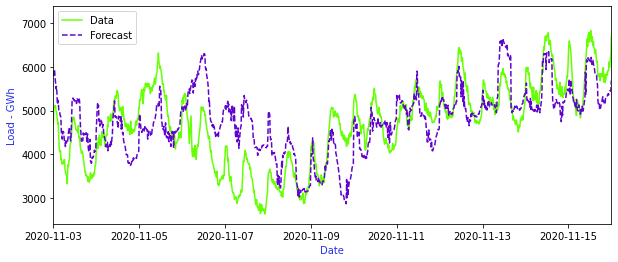

In [ ]:
y_mul_par = RF_model.predict(x_test)
plot_forecast(y_mul_par,df_test_y)
eval_error(y_mul_par,df_test_y)

In [ ]:
RF_MPE, RF_MAE, RF_MSE, RF_RMSE = eval_error_alt(y_mul_par,df_test_y)

Mean Percentual Error - [%] 13.55
Mean Absolute Error - [kWh] 602.54
Mean Square Error - [kWh^2] 550918.47
Root Mean Square error - [kWh] 742.24


In [ ]:
trainPredict = RF_model.predict(x_ent)
testPredict= RF_model.predict(x_test)
predicted=np.concatenate((trainPredict,testPredict),axis=0)

subfig = make_subplots(specs=[[{"secondary_y": True}]])
fig = px.line(df, y='Dem',x='Date')
fig.update_traces(line_color='blue')
fig2 = px.line(x=df_ent['Date'], y=trainPredict.reshape(-1))
fig2.update_traces(line_color='orange')
#fig2.update_traces(yaxis="y2")
fig3 = px.line(x=df_test['Date'], y=testPredict.reshape(-1))
fig3.update_traces(line_color='red')
#fig3.update_traces(yaxis="y2")
subfig.add_traces(fig.data + fig2.data + fig3.data)
subfig.show()

# 3.7. KNN Regressor
Instead of using ANN to do the prediction a K nearest neighbors regressor is employed obtaining similar results.

Mean error 13.18
Root mean squere error - kWh 602.8


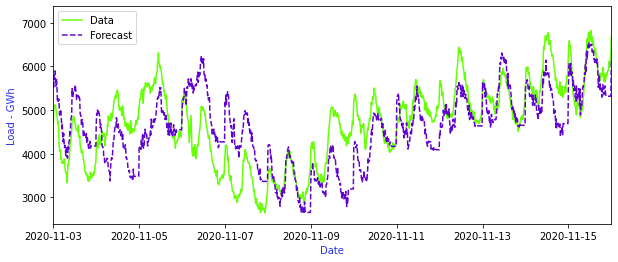

In [ ]:
from sklearn.neighbors import KNeighborsRegressor
KNN_model = KNeighborsRegressor(n_neighbors=24*7)
KNN_model.fit(df_ent_x,df_ent_y)
y_mul_par = KNN_model.predict(x_test)
plot_forecast(y_mul_par,df_test_y)
eval_error(y_mul_par,df_test_y)

In [ ]:
KNN_MPE, KNN_MAE, KNN_MSE, KNN_RMSE = eval_error_alt(y_mul_par,df_test_y)

Mean Percentual Error - [%] 13.18
Mean Absolute Error - [kWh] 602.8
Mean Square Error - [kWh^2] 529252.83
Root Mean Square error - [kWh] 727.5


In [ ]:
trainPredict = KNN_model.predict(x_ent)
testPredict= KNN_model.predict(x_test)
predicted=np.concatenate((trainPredict,testPredict),axis=0)

subfig = make_subplots(specs=[[{"secondary_y": True}]])
fig = px.line(df, y='Dem',x='Date')
fig.update_traces(line_color='blue')
fig2 = px.line(x=df_ent['Date'], y=trainPredict.reshape(-1))
fig2.update_traces(line_color='orange')
#fig2.update_traces(yaxis="y2")
fig3 = px.line(x=df_test['Date'], y=testPredict.reshape(-1))
fig3.update_traces(line_color='red')
#fig3.update_traces(yaxis="y2")
subfig.add_traces(fig.data + fig2.data + fig3.data)
subfig.show()

# 3.8 Models Summary

In [ ]:
scores = [['Last Week'          , LW_MPE  , LW_MAE  , LW_MSE  , LW_RMSE ],
          ['Neural Network'     , ANN_MPE , ANN_MAE , ANN_MSE , ANN_RMSE],
          ['Random Forest'      , RF_MPE  , RF_MAE  , RF_MSE  , RF_RMSE ],
          ['K Nearest Neighbors', KNN_MPE , KNN_MAE , KNN_MSE , KNN_RMSE]]

# create series from dictionary
summary = pd.DataFrame(scores, columns = ['Method', 'Test MPE', 'Test MAE', 'Test MSE', 'Test RMSE'])
summary.set_index('Method')

,Test MPE,Test MAE,Test MSE,Test RMSE
Method,,,,
Last Week,12.89,585.84,516911.50,718.97
Neural Network,12.47,555.86,466353.71,682.90
Random Forest,13.55,602.54,550918.47,742.24
K Nearest Neighbors,13.18,602.80,529252.83,727.50


The two best models correspond to the ANN model and the simple approach with similar results. It's worth to highlight that even when the ANN consistently outperforms by a a small percentage the simple approach, their behaviors are very similar and the ANN suffers some variablity depending on the initialization and the hiperparameters. Considering this, the conclusion would be to use the neural network approach recognizing that it's heavily influenced by the previous day data.

# 4 Production - Scoring

<div style='width: auto; float: center'/>
 <img src="https://raw.githubusercontent.com/dlalvareza/Quebec_Challenge/master/01_Figure/IC_Pipeline_eng_Production.svg" style='height: 150px; width: auto; object-fit: contain; center: right'/>       
</div>

As the challenge statement requires the preictions with 1h resolution, the scoring dataframe is sampled accordingly even when it was trained on the 15 min resolution data.

In [ ]:
df_score = df_test[df_test['hour']%1 == 0]
df_score_x = df_score[interest_vars].to_numpy()
df_score_y = df_score['Dem'].to_numpy()

## Reference Performance
As stated before, the simple approach gives a straightforward and competitive result which is presented as reference to the comparison of the final model.

In [ ]:
df_buff = df_test[df_test['hour']%1 ==0].copy()
y_simple = df_buff['Dem_24'].to_numpy()
eval_error_alt(y_simple,df_score_y)

Mean Percentual Error - [%] 12.77
Mean Absolute Error - [kWh] 577.92
Mean Square Error - [kWh^2] 504091.93
Root Mean Square error - [kWh] 709.99


(12.77, 577.92, 504091.93, 709.99)

## Best Model performance
As main scoring model, the ANN model is presented an evaluated with the test data presenting also the visual comparison with the simple approach. Note that the model hiperparameters and the initialization may change the score within an observed range from approximately [458k to 502k] being the typical values around 478k.

In [ ]:
y_score = ANN_model.predict(df_score_x.astype('float64'))
eval_error_alt(y_score[:,0],df_score_y)
subfig = make_subplots()
fig = px.line(df_score, y='Dem',x='Date')
fig.update_traces(line_color='blue')
fig2 = px.line(y=y_simple,x=df_score['Date'],labels=['Simple Approach'])
fig2.update_traces(line_color='green')
fig3 = px.line(y=y_score[:,0],x=df_score['Date'],labels=['ANN Approach'])
fig3.update_traces(line_color='orange')

subfig.add_traces(fig.data + fig2.data + fig3.data)
subfig.show()

Mean Percentual Error - [%] 12.3
Mean Absolute Error - [kWh] 546.17
Mean Square Error - [kWh^2] 456825.65
Root Mean Square error - [kWh] 675.89


Note: To be completeley clear, the main submission corresponds to the ANN model and the secundary submission corresponds to the "Simple Model".